In [ ]:
import pandas as pd

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

MessageError: ignored

In [ ]:
import numpy as np

## this is a dog identification project

In [ ]:
!unzip "drive/MyDrive/dog-breed-identification.zip" -d "drive/MyDrive/1_dog_vision/"

Streaming output truncated to the last 5000 lines.
  inflating: drive/MyDrive/1_dog_vision/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: drive/MyDrive/1_dog_vision/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: drive/MyDrive/1_dog_vision/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: drive/MyDrive/1_dog_vision/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: drive/MyDrive/1_dog_vision/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: drive/MyDrive/1_dog_vision/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: drive/MyDrive/1_dog_vision/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: drive/MyDrive/1_dog_vision/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: drive/MyDrive/1_dog_vision/train/83fad0718581a696132c96c166472627.jpg  
  inflating: drive/MyDrive/1_dog_vision/train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: drive/MyDrive/1_dog_vision/train/8403d8936430c2f05ab7d74d23c2c0cb.jpg  
  inflating: d

 # End-to-end Multi-class Dog Breed Classification

 ## 1. Problem
  Identifying the breed of a dog from given image.

 ## 2. Data
  The data we're using is from Kaggle's dog breed identification competition.

 ## 3. Evaluation
  The evaluation is a file with prediction probabilities for each dog breed of each test image.

 ## 4. Features
  Some information about the data:
  * We're dealing with imaages (unstructured data) so it's probably best we use deep learning/transfer learning.

  * There are 120 breeds of dogs (This means there are 120 different classes)

  * There are around 10,000+ images in training set

  * There are around 10,000+ images in test set (These images have no labels, because we'll want to predict them)

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
print ("TF version",tf.__version__)
print ("TF version",hub.__version__)

# check for GPU availability
print("GPU","available(YESS!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version 2.14.0
TF version 0.15.0
GPU available(YESS!!!)


## getting our data ready

with all machinel learning models , our data has to ve in numerical format, so thea's what we'll be doing first.Turning our images into Tensor (numerical representation)

In [ ]:
# checkout the lablels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/1_dog_vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: >

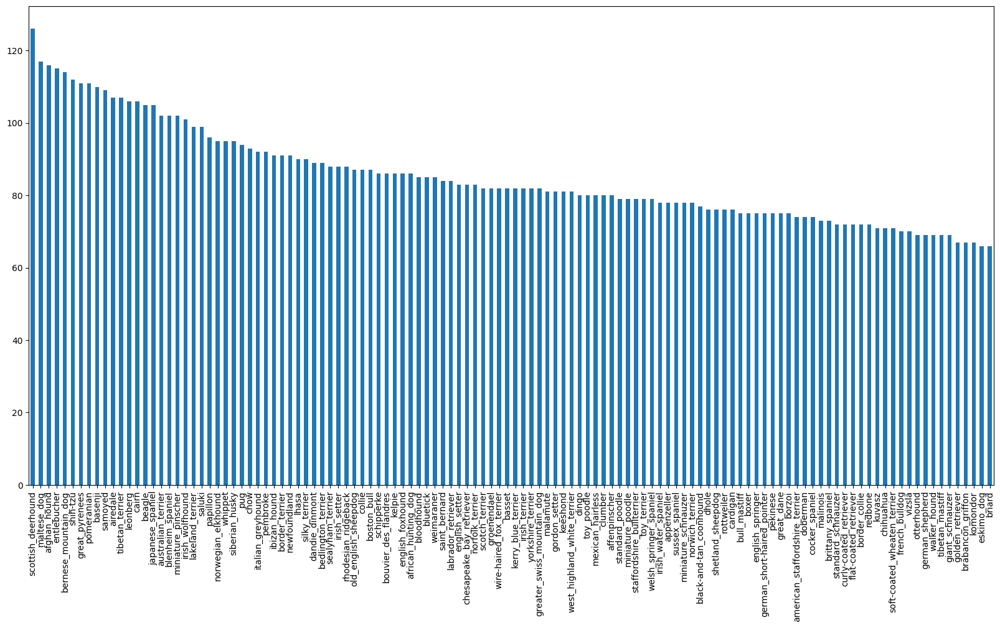

In [ ]:
# how many images are there of each breeds
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

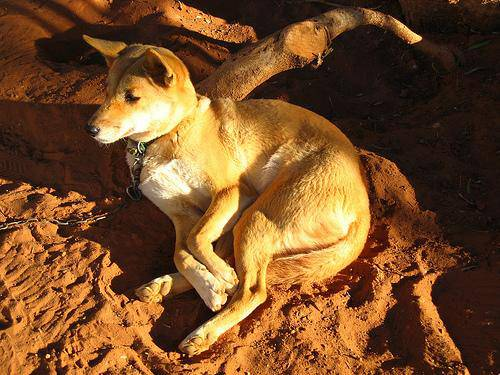

In [ ]:
from IPython.display import Image
Image("drive/MyDrive/1_dog_vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

let's get a list of all of our image pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from images ID's
filenames = ["drive/MyDrive/1_dog_vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames

['drive/MyDrive/1_dog_vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/1_dog_vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/1_dog_vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/1_dog_vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/1_dog_vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/1_dog_vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/1_dog_vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/1_dog_vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/1_dog_vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/1_dog_vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 'drive/MyDrive/1_dog_vision/train/004396df1acd0f1247b740ca2b14616e.jpg',
 'drive/MyDrive/1_dog_vision/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 'drive/MyDrive/1_dog_vision/train/00693b8bc2470375cc744a6391d397ec.jpg',
 'drive/MyDrive/1_dog_vision/train/006

In [ ]:
# check wether number of filenames mathces number of actual image files
import os
if len(os.listdir("drive/MyDrive/1_dog_vision/train/")) == len(filenames):
  print("Filenames match actual amount of files!! Proceed.")
else:
  print("Filenames do not match actual amount of files , check target directory")

Filenames match actual amount of files!! Proceed.


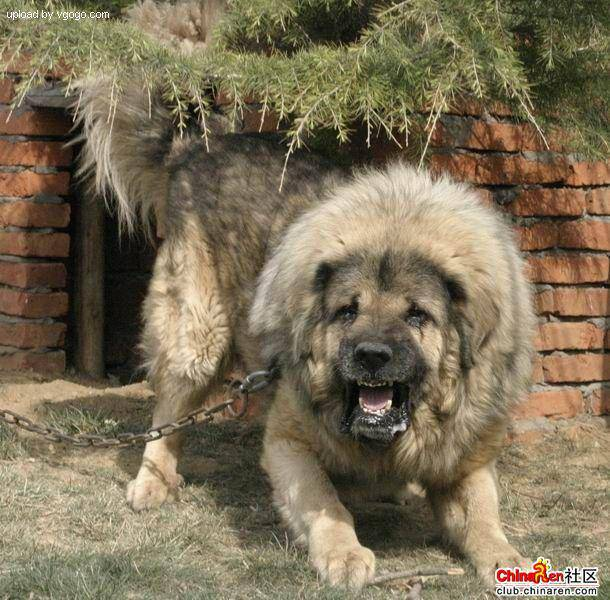

In [ ]:
# One  More Check
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've got our training image filepaths in a list, let's prepare our labels

In [ ]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames")
else:
  print("Number of labels dosen't match the number of filenames, check file directory!!")

Number of labels matches number of filenames


In [ ]:
# find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into lan array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn wvery label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0])
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the samble label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:10]

['drive/MyDrive/1_dog_vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/1_dog_vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/1_dog_vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/1_dog_vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/1_dog_vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/1_dog_vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/1_dog_vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/1_dog_vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/1_dog_vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/1_dog_vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

## Creating our own validation set

since the datset from kaggle dosen't come with a validation set, we're going to create our own.

In [ ]:
# setup x and y variables
x = filenames
y = boolean_labels

In [ ]:
len(filenames)

10222

we're going to start off experimenting with ~1000 images and increase as needed

In [ ]:
# set number of images to use for experimenting
NUM_IMAGES  = 1000 #@param{type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size  NUM_IMAGES
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(x_train), len(y_train), len(x_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# let's have a gaze at the training data
x_train[:5], y_train[:5]

(['drive/MyDrive/1_dog_vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/1_dog_vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/1_dog_vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/1_dog_vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/1_dog_vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, Fals

## Preprocessing images(turning images into Tensor)

to preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable , `image`
3. Turn our `image` (jpg) into Tensors
4. Resize the `image`to be a shape of (224, 224)
5. Return the modifies `image`

In [ ]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]

In [ ]:
image.max(),image.min()

(255, 0)

In [ ]:
# Turn image into a Tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

## Now we've seen what an image looks like as a Tensor, let's make a fuction to preprocess them.

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable , `image`
3. Turn our `image` (jpg) into Tensors
4. Resize the `image`to be a shape of (224, 224)
5. Return the modifies `image`

In [ ]:
# Define image size
IMG_SIZE = 224
# Creat a funtion for preprocessing images
def process_image(image_path,  img_size=IMG_SIZE):
  """
  Take an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Trun jpeg image into numerical Tensor with 3 coloures (red, green, blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values form 0-225 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value(244,244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

# Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

so that's why we do about 32 (This is the batch size) images at a time(you can manually adjust the batch size if need be.)

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which looks like this:`(image, labels)`

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes as image file path nambe and the associated label,processes the image and returns a tuple of (image, label).
  """

  image = process_image(image_path)
  return image, label

In [ ]:
# demo of the above
(process_image(x[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: `(images, labels)`.Let's make a function to turn all our data (x & y) into batches!

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create f fuction to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  creates batches of data ourt image (x) and (y) pairs.
  shuffles the data if it's training data but dosen't shuffle if it's validation data
  Also accepts test data as input (no labels).
  """
  # if the data is a test dataset , we probably don't have labels
  if test_data:
    print("Creating test data batches....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # if the data is a valid dataset, we won't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                                 tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))

    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create(image, labels) tuples (This also turns the image path into preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch


In [ ]:
# Creating training and validation data batches
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing data batches

Our data is now in bathces, however, these can be a little hard to understand/comprehend , let's visualize

In [ ]:
import matplotlib.pyplot as plt

# create a function for viewing images in a batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  # setup the figure
  plt.figure(figsize=(10,10))

  # Loop through 25 (for 25 images)
  for i in range(25):

    # Create a subplot (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)

    # Display an image
    plt.imshow(images[i])

    # Add the images label as the title
    plt.title(unique_breeds[labels[i].argmax()])

    # Turn the grid lines off
    plt.axis("off")   # to make the images look spaced between each other

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
train_images ,train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.1377326 , 0.22346345, 0.11700305],
          [0.23252553, 0.30763057, 0.19563921],
          [0.189171  , 0.23913285, 0.12143797],
          ...,
          [0.62581116, 0.6604751 , 0.65875924],
          [0.51773745, 0.5334237 , 0.5451884 ],
          [0.52265537, 0.53834164, 0.55010635]],
 
         [[0.25052395, 0.3207971 , 0.23725367],
          [0.05130488, 0.10808291, 0.02970343],
          [0.12517099, 0.15688428, 0.06729877],
          ...,
          [0.54057753, 0.5637918 , 0.5656825 ],
          [0.5297618 , 0.54544806, 0.55721277],
          [0.4893205 , 0.5050068 , 0.5167715 ]],
 
         [[0.37000483, 0.41180843, 0.35321406],
          [0.24726024, 0.27108258, 0.21825583],
          [0.2645443 , 0.27110162, 0.22206265],
          ...,
          [0.5270998 , 0.54968387, 0.55188966],
          [0.50706005, 0.5227463 , 0.534511  ],
          [0.51150376, 0.52719   , 0.53895473]],
 
         ...,
 
         [[0.33149698, 0.3085978 , 0.31612584],
          [0.35751

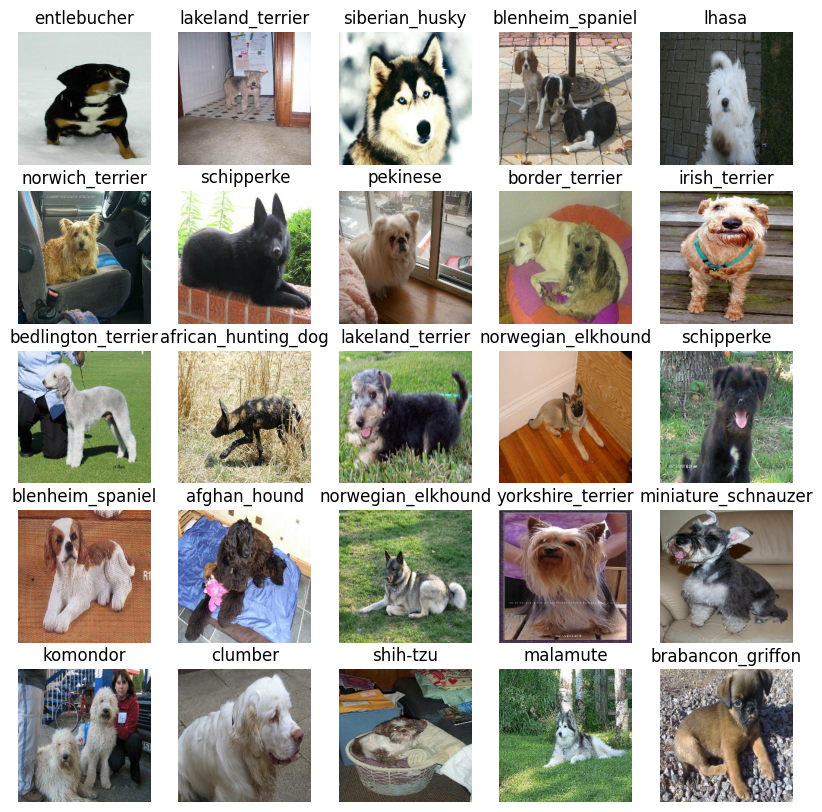

In [ ]:
# now let's visualize the data in a training batch

train_images ,train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

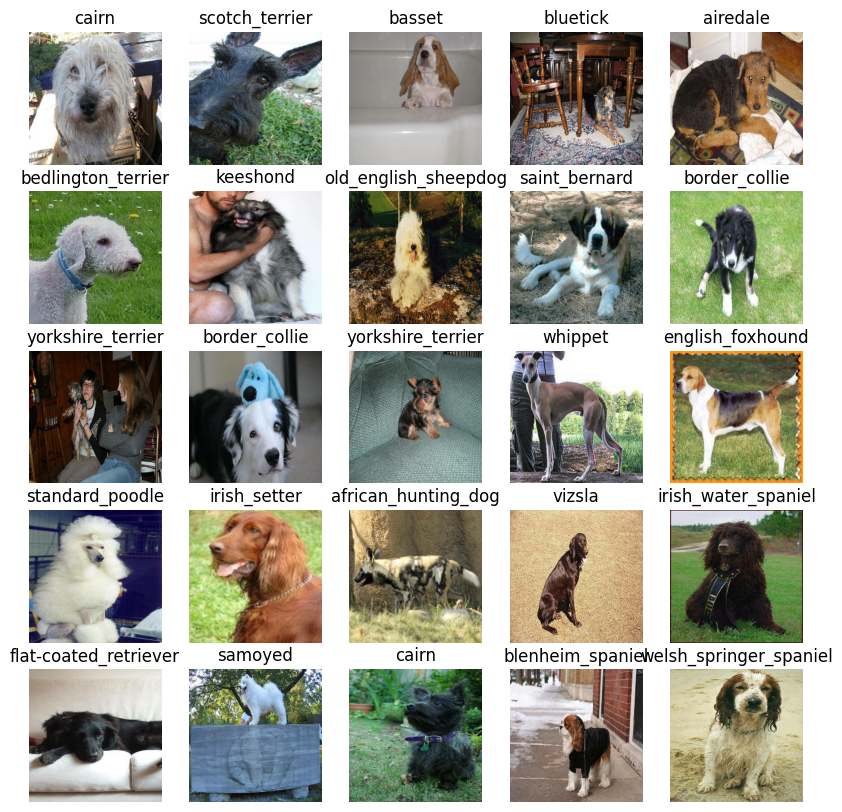

In [ ]:
val_images,val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

In [ ]:
len(train_images), len(train_labels)

(32, 32)

In [ ]:
len(train_data), len(val_data)

(125, 32)

# Building a model
Before we build a mode, there are fwe things we need to define:
* the input shape (our images shape, in the form of tensors)to our model.
* the output shape (our images shape, in the form of tensors)to our model.
* The URL of the model we want to use.

In [ ]:
# setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

# Setup output shape of our model
OUTPUT_SHAPE =  len(unique_breeds)

# Setup model URL from TesorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"


Now we've got our inputs, outputs and model ready to go.
Let's put them together into a Keras deep learning model!

Knowing this , let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameter.

* Defines the layers in a Keras in sequential fashion(do this first, then this, then that).

* Compiles the model(says it should be evaluated and improved),

* builds the model(tells the model the input shape it'll be getting).

* Returns the model.

All of these steps can be found here:https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [ ]:
# Create a functon which builds a Keras model
def create_model(input_shape=INPUT_SHAPE,  output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup model layers
  model = tf.keras.Sequential([
       hub.KerasLayer(MODEL_URL),  # layer 1(input layer)
       tf.keras.layers.Dense(units=OUTPUT_SHAPE,
        activation="softmax")  # layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model


In [ ]:
model = create_model()
model.summary()


Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


# creating callbacks

- Callbacks  are helper functions a model can use during training to do such things as save its pr progress, check its progress early if a model stops improving .

- We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

## TenorBoard Callback

To setup a TensorBoard callback , we need to do 3 things:

1. Load the TensorBoard notebook extension.

2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this afeter model training)

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# create a function to build a TensorBoard Callback
def create_tensorboard_callback():
  # create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/1_dog_vision/logs",
                      # Make it so the log got tracked whenever we run experiment
                      datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.


In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

# Training a model(on subset of data)
Our first model is only going to train 1000 images, to make sure everything is working

In [ ]:
NUM_EOPOCS = 100 #@param {type:"slider",min:10, max:100, step:10}

In [ ]:
# Check to make sure we're sill runnin on a GPU
print("GPU", "available (yess!!!)") if tf.config.list_physical_devices("GPU") else "not available"

GPU available (yess!!!)


Let's create a functon which trains a model.

* Create a model using `create_model`
* Setup a TensorBoard callback using `create_tensorboard_callback()
* Create `fit()` funcion on our model passing it the training data, validation data, number of epochs to train for (NUM_EOPOCS)  and the callback we'd like to use
* Return the model.

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # fit the model to the data passing it the callback we've created
  model.fit(x=train_data,
            epochs= NUM_EOPOCS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model


In [ ]:
# fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 146s 5s/step - loss: 4.4317 - accuracy: 0.0962 - val_loss: 3.3736 - val_accuracy: 0.2600
Epoch 2/100
25/25 [==============================] - 3s 134ms/step - loss: 1.5382 - accuracy: 0.7188 - val_loss: 2.1431 - val_accuracy: 0.5200
Epoch 3/100
25/25 [==============================] - 3s 99ms/step - loss: 0.5264 - accuracy: 0.9312 - val_loss: 1.6903 - val_accuracy: 0.6300
Epoch 4/100
25/25 [==============================] - 2s 97ms/step - loss: 0.2410 - accuracy: 0.9900 - val_loss: 1.4977 - val_accuracy: 0.6500
Epoch 5/100
25/25 [==============================] - 3s 104ms/step - loss: 0.1416 - accuracy: 0.9962 - val_loss: 1.4411 - val_accuracy: 0.6600
Epoch 6/100
25/25 [==============================] - 4s 164ms/step - loss: 0.0972 - accuracy: 1.0000 - val_loss: 1.3825 - val_accuracy: 0.6700
Epoch 7/100
25/25 [==============================] -

** Question **

it looks like our model is overfitting because it's performing far better on the training dataset
then the validation dataset, what are some ways to prevent model overfitting in deep learning networks?

** Note: **

Overfitting is good thing, it means our model is learning.

# Checking the TensorBoard logs
The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir drive/MyDrive/1_dog_vision/logs

Output hidden; open in https://colab.research.google.com to view.

# Making and evaluating predictions using a trained model

In [ ]:
# Make predition on the validation data (not used to train on)
predictions = model.predict(val_data,verbose=1)
predictions


7/7 [==============================] - 38s 81ms/step


array([[4.1480234e-04, 7.0240101e-05, 1.6315185e-04, ..., 5.1114557e-04,
        1.8444091e-05, 4.9895477e-03],
       [1.8674247e-03, 4.1139568e-04, 2.9977407e-02, ..., 3.2351124e-03,
        1.8806052e-03, 4.9402879e-04],
       [5.5819278e-06, 1.4704891e-05, 6.6956847e-05, ..., 3.9094308e-04,
        1.0934790e-04, 4.3860928e-04],
       ...,
       [7.8362873e-06, 2.8955154e-05, 5.3969517e-05, ..., 2.9290182e-05,
        5.1551186e-05, 2.8448645e-05],
       [2.8800876e-03, 1.4155882e-04, 2.2391931e-04, ..., 3.7249128e-04,
        4.5986308e-05, 5.5996221e-03],
       [1.1852642e-04, 5.4947752e-05, 6.2473660e-04, ..., 4.5700367e-03,
        1.0578436e-03, 2.9142678e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(unique_breeds)

120

In [ ]:
# First predictions
index=42
print(predictions[0])
print(f"Max valu (probablity of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[4.14802344e-04 7.02401012e-05 1.63151853e-04 3.70249327e-04
 1.90082108e-04 1.49224406e-05 6.35925634e-03 1.74726825e-04
 8.03235744e-05 4.29804408e-04 1.22824125e-03 2.92931800e-04
 5.09776874e-04 3.33018179e-05 7.68470869e-04 3.16584570e-04
 2.52274949e-05 3.03354338e-02 2.37976255e-05 9.83893478e-05
 1.80728399e-04 1.76939869e-03 7.86418877e-06 1.28633657e-03
 9.70513429e-06 4.51216649e-04 2.48524044e-02 3.46032728e-04
 1.05063948e-04 1.40452670e-04 1.43481984e-05 3.56382050e-04
 4.91259038e-04 1.83972388e-05 5.85873640e-05 8.32780264e-03
 4.95936401e-05 9.46904329e-05 5.43851165e-05 5.20068534e-05
 1.10333704e-03 2.50287849e-05 1.04244355e-04 1.58429248e-04
 1.77578957e-04 2.55479186e-04 1.11886286e-04 1.08777755e-03
 2.54253927e-03 1.61824632e-04 1.41009645e-04 5.46547526e-05
 7.00037053e-04 1.90572900e-04 3.23351356e-04 1.95536941e-05
 2.10585189e-04 3.68499639e-03 9.54293719e-05 6.56896293e-01
 1.03849627e-04 1.73031058e-05 1.31645007e-03 7.24023339e-05
 6.43870386e-04 1.708211

In [ ]:
unique_breeds[113]

'walker_hound'

 Having the above funchionality is great but we want to be able to do it at scale.

 And it would be even better if we could see the image that predition is made on

 ** Note: ** Prediction probablities are also known as confidence.


In [ ]:
# Turn prediction probablities into their respective label (easier to understand)
def get_pred_label(prediction_probablities):
  """
  Turns an array of predictions probablities into a label.
  """
  return unique_breeds[np.argmax(prediction_probablities)]

  # Get a predicted label based on an array of precdiction probablities
pred_label = get_pred_label(predictions[9])
pred_label

'collie'

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Now since our validation data is still in a batch dataset, we'll have to unbatch it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels)

In [ ]:
# Create a function to unbatch a batch dataset
images_=[]
labels_=[]

# loop through unbatched data
for image,label in val_data.unbatch().as_numpy_iterator():
   images_.append(image)
   labels_.append(label)

images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'cairn'

In [ ]:
# Create a function to unbatch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and retruns separate arrays of images and labels
  """
  images=[]
  labels=[]

  # Loop through

  for image,label in data.unbatch().as_numpy_iterator():
     images.append(image)
     labels.append(unique_breeds[np.argmax(label)])

  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[90])

'english_foxhound'

Now we've got ways to get :
 * Prediction labels
 * Validation labels(truth labels)
 * validation images

Let's make some functions to make these all bit more visual.


We'll create a fucntion which:

  * Takes an array of prediction probablities , and array of truth labels and an array of images and integers.

  * Convert the predictions probablities predicted label

  * Plot the predicted label, its predicted probablity, the truth label and the target image on a single spot
  

In [ ]:
def plot_pred(prediction_probablities,labels,images,n=1):
  pred_prob,true_label, image = prediction_probablities[n],labels[n],images[n]
  # get pred label
  pred_label = get_pred_label(pred_prob)
  # plot image & remove Ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  # change color
  if pred_label == true_label:
    color="green"
  else:
    color="red"
  # change plot title to be predicted, probability of prediction and truth label
  plt.title("{}:{:2.0f}%\n Actual_Label:{}".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),color=color)

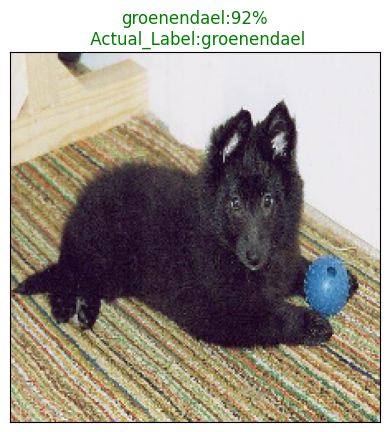

In [ ]:
plot_pred(prediction_probablities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now we've got one function to visualize our model top prediction, let's make another to view top 10 predictions


This function will :
* Take an input of prediction probabilities array and a ground truth array and an integer.

* Find the predictions using `get_pred_label()`.

* Find the top 10:
  * Prediction porbabilites indexes.
  * Prediction probabilites values.
  * Prediction labesl.

* Plot the top 10 prediction probabilities values and labels, coloring the true label green.

In [ ]:
def plot_pred_conf(prediction_probablities, labels, n=1):
  """
  Plus the top 10 highest predictions confidences along with the truth labal for sample n.
  """
  pred_prob, true_label = prediction_probablities[n], labels[n]

  # Get the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 predictions confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction confidence labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]


  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

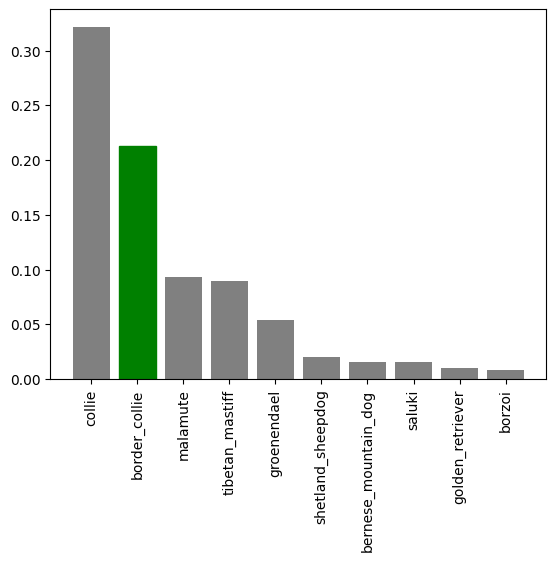

In [ ]:
plot_pred_conf(prediction_probablities=predictions,
               labels=val_labels,
               n=9)

In [ ]:
predictions

array([[2.49045249e-03, 2.04530268e-04, 1.57633668e-03, ...,
        9.03451117e-04, 1.86721409e-05, 3.38222319e-03],
       [7.64337601e-03, 9.23276355e-04, 8.26989207e-03, ...,
        4.23220015e-04, 2.88019120e-03, 9.21351369e-04],
       [3.75012110e-06, 1.05159757e-04, 1.00775884e-04, ...,
        4.60059127e-05, 8.60202344e-05, 7.05353086e-05],
       ...,
       [1.62503165e-05, 1.65984711e-05, 2.03925840e-04, ...,
        5.55955330e-06, 3.71943112e-04, 3.16870341e-04],
       [7.64744543e-03, 7.69728445e-04, 1.96136825e-04, ...,
        3.02901928e-04, 7.89156256e-05, 3.23901922e-02],
       [2.67901830e-03, 1.30226872e-05, 6.41794875e-04, ...,
        2.80389376e-02, 4.29726526e-04, 2.66768679e-04]], dtype=float32)

Now we've got some functions to help us visualize our predictions and evaluate our model, let's check out few.


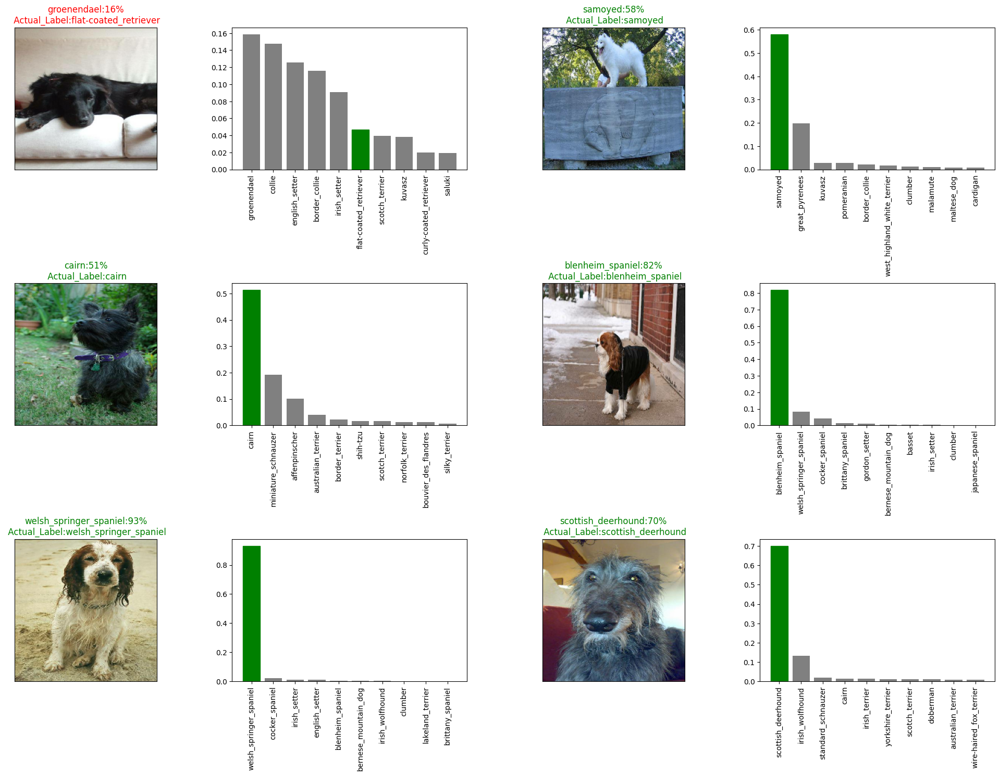

In [ ]:
i_multiplier = 20
num_rows =3
num_cols =2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols, 2*i+1)
  plot_pred(prediction_probablities=predictions,
           labels=val_labels,
           images=val_images,
           n= i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probablities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [ ]:
val_labels[:5]

['cairn', 'scotch_terrier', 'basset', 'bluetick', 'airedale']

** Challenge **

How would you create a confusion matrix with our models predictions and true labels?

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string)
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/1_dog_vision/models",
                    datetime.datetime.now().strftime("%Y%m%d-%M%H%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to : {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load function model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                    custom_objects={"KerasLayer":hub.KerasLayer })
  return model

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="MobilenetV2_on_1000_images")

Saving model to : drive/MyDrive/1_dog_vision/models/20231129-05141701266746-MobilenetV2_on_1000_images.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/1_dog_vision/models/20231129-05141701266746-MobilenetV2_on_1000_images.h5'

In [ ]:
loaded_1000_image_model = load_model("drive/MyDrive/1_dog_vision/models/20231112-42131699796545-MobilenetV2_on_1000_images.h5")

Loading saved model from: drive/MyDrive/1_dog_vision/models/20231112-42131699796545-MobilenetV2_on_1000_images.h5


In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 76ms/step - loss: 1.2817 - accuracy: 0.6200


[1.2817012071609497, 0.6200000047683716]

# Training big dog model (with full dataset)

In [ ]:
full_data = create_data_batches(x,y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No validation set when training all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [ ]:
# Fit the full model to full data
full_model.fit(x=full_data,
               epochs=NUM_EOPOCS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 1249s 4s/step - loss: 1.3279 - accuracy: 0.6724
Epoch 2/100
320/320 [==============================] - 29s 91ms/step - loss: 0.3984 - accuracy: 0.8819
Epoch 3/100
320/320 [==============================] - 30s 94ms/step - loss: 0.2370 - accuracy: 0.9366
Epoch 4/100
320/320 [==============================] - 28s 88ms/step - loss: 0.1538 - accuracy: 0.9642
Epoch 5/100
320/320 [==============================] - 30s 93ms/step - loss: 0.1050 - accuracy: 0.9787
Epoch 6/100
320/320 [==============================] - 30s 92ms/step - loss: 0.0775 - accuracy: 0.9869
Epoch 7/100
320/320 [==============================] - 29s 89ms/step - loss: 0.0580 - accuracy: 0.9917
Epoch 8/100
320/320 [==============================] - 30s 93ms/step - loss: 0.0474 - accuracy: 0.9934
Epoch 9/100
320/320 [==============================] - 29s 89ms/step - loss: 0.0377 - accuracy: 0.9952
Epoch 10/100
320/320 [==============================] - 29s 92ms/step - l

In [ ]:
save_model(full_model, suffix="full_dataset_MobilenetV2")

Saving model to : drive/MyDrive/1_dog_vision/models/20231129-35141701268511-full_dataset_MobilenetV2.h5...


'drive/MyDrive/1_dog_vision/models/20231129-35141701268511-full_dataset_MobilenetV2.h5'

In [ ]:
loaded_full_image_model = load_model("drive/MyDrive/1_dog_vision/models/20231112-57171699811828-full_dataset_MobilenetV2.h5")

Loading saved model from: drive/MyDrive/1_dog_vision/models/20231112-57171699811828-full_dataset_MobilenetV2.h5


# Making predictions on the test Dataset

Since our model has been trained on images in the forn of Tensor batches, to make predictions on the test data, we'll have to get it into the sane forms.

Luckliy we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor Batches.

To make predictions on the test data, we'll:

* Get the test image filenames.

* convert the filenames into test data batches using `create_data_batches()` and the `test data` parameters to `True` (since the test data dosen't have labels)

* Make predictions array by passing the test batches to the `predict()` method we called on our model

In [ ]:
# Load test image filenames
test_path = "drive/MyDrive/1_dog_vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/1_dog_vision/test/e5a89b25873ada7aaafec0de1af86cb1.jpg',
 'drive/MyDrive/1_dog_vision/test/dd703c7beeaf5cba5533d5f42b608f2e.jpg',
 'drive/MyDrive/1_dog_vision/test/e15513ca7ebb4730731f34c25e906502.jpg',
 'drive/MyDrive/1_dog_vision/test/e280f6f772fa8439dcf0957a0e8b8e1d.jpg',
 'drive/MyDrive/1_dog_vision/test/dcae38083c0e6a8afe15b6f0703bdefa.jpg',
 'drive/MyDrive/1_dog_vision/test/ddbb53bb7ea7060847a0bd4554877e80.jpg',
 'drive/MyDrive/1_dog_vision/test/de327414ced20d4e6f786a68bff82e10.jpg',
 'drive/MyDrive/1_dog_vision/test/ddfbebe13aa8fba30f347c58466215df.jpg',
 'drive/MyDrive/1_dog_vision/test/e26d745f820e6b14cae26bb5def0648f.jpg',
 'drive/MyDrive/1_dog_vision/test/deaf748bed865ec76758f086db04bfac.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create  test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches....


In [ ]:
# Make predictions on the test data batch using the load full model
test_predictions = loaded_full_image_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 156s 466ms/step


In [73]:
# Save predictions (NumPy Array) to csv file(for Access later)
np.savetxt("drive/MyDrive/1_dog_vision/preds_array.csv",test_predictions, delimiter=",")

In [75]:
test_predictions = np.loadtxt("drive/MyDrive/1_dog_vision/preds_array.csv",delimiter=",")

# Preparing test dataset predictions for Kaggle

looking at the kaggle sample submission, we find out that it wants our models prediction probablity ourputs in the DataFrame with an ID and a column for each different dog breed.

### to get the data in this format, we'll

* Create a pandas DataFrame with an ID column as well as a column for each dog breed.

* Add data to the ID column by extracting the test image ID's from their filepaths.

* Add data(The prediction probabilites) to each of the dog breed columns.

* Export the DataFrame as a CSV to submit it to Kaggle

In [76]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [80]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
test_ids

['e5a89b25873ada7aaafec0de1af86cb1',
 'dd703c7beeaf5cba5533d5f42b608f2e',
 'e15513ca7ebb4730731f34c25e906502',
 'e280f6f772fa8439dcf0957a0e8b8e1d',
 'dcae38083c0e6a8afe15b6f0703bdefa',
 'ddbb53bb7ea7060847a0bd4554877e80',
 'de327414ced20d4e6f786a68bff82e10',
 'ddfbebe13aa8fba30f347c58466215df',
 'e26d745f820e6b14cae26bb5def0648f',
 'deaf748bed865ec76758f086db04bfac',
 'e79030be9c9769f3604474aea16039bd',
 'eceb457b878bc73e565b0efa002d5563',
 'e83fec66a32873298df9fa5fdac113aa',
 'f0d2e080797f5e1f54bfa26bda41887b',
 'ec6734fb75cab5100481b7b6e711d936',
 'ebf3e1d5583ceff0a51a8c6a750b367b',
 'f3ad6585619f3489fe3c01b4e305f70b',
 'f13011a399f175d88c17d2bd1785625e',
 'ec24efc47314fd121b67155b56eabccf',
 'f5319adc463ccf7e82f10a34ce39c190',
 'ec0efefd564e6632ca11b424b6dcd2d4',
 'ed48b89faa9069c700db2448696a97af',
 'f155d5fe889d139892c1d7d46804f419',
 'ea111bb38037c9922185a0e9513391d7',
 'ebe58f64e95c071d30eaceb907b7375c',
 'f0f205d037fe626670165aca00fc8b81',
 'ef5c93599bcc330fd9642266d9650309',
 

In [82]:
preds_df["id"] = test_ids

In [83]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e5a89b25873ada7aaafec0de1af86cb1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,dd703c7beeaf5cba5533d5f42b608f2e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e15513ca7ebb4730731f34c25e906502,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e280f6f772fa8439dcf0957a0e8b8e1d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,dcae38083c0e6a8afe15b6f0703bdefa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [84]:
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e5a89b25873ada7aaafec0de1af86cb1,7.428524e-01,1.637800e-06,2.582224e-07,9.970562e-12,2.454041e-11,1.951196e-11,1.202040e-06,1.259318e-04,3.168640e-10,...,5.776278e-08,7.328484e-05,2.490784e-09,1.881239e-06,1.002842e-12,3.801472e-08,1.213640e-05,3.746843e-08,9.969605e-02,2.639739e-05
1,dd703c7beeaf5cba5533d5f42b608f2e,6.777826e-11,5.595420e-08,1.471270e-10,4.590714e-09,2.619565e-09,7.963157e-11,3.041682e-13,1.892086e-11,1.527182e-10,...,4.282690e-13,6.937654e-12,6.732341e-12,1.878336e-11,5.626447e-11,3.953429e-13,8.824893e-14,1.261040e-09,3.558283e-14,3.334539e-11
2,e15513ca7ebb4730731f34c25e906502,4.767796e-09,9.503975e-07,4.863249e-10,2.035775e-09,7.745050e-10,4.097200e-12,2.693981e-13,5.083561e-11,2.463415e-13,...,5.007509e-10,8.882525e-13,2.982206e-12,4.110186e-11,3.407744e-11,8.226015e-13,3.057006e-12,2.155513e-08,1.970634e-07,1.006868e-12
3,e280f6f772fa8439dcf0957a0e8b8e1d,2.502079e-09,2.798553e-09,4.622212e-07,3.308360e-10,5.271696e-08,3.514494e-08,1.341223e-08,4.483417e-07,1.264911e-10,...,1.937140e-09,3.435339e-09,2.160195e-10,8.913707e-08,3.218985e-08,5.515393e-08,1.542464e-07,4.749099e-09,1.576297e-08,5.106025e-08
4,dcae38083c0e6a8afe15b6f0703bdefa,4.412798e-11,3.095210e-03,3.717795e-09,5.235012e-11,2.755165e-08,3.735477e-10,2.307423e-09,1.685276e-11,2.283984e-09,...,1.682998e-07,2.995596e-11,4.152647e-08,1.184898e-06,1.991230e-05,3.836372e-10,4.247936e-13,5.216799e-06,3.769153e-09,4.825038e-07


In [85]:
preds_df.to_csv("drive/MyDrive/1_dog_vision/full_model_prediction_submission_mobilenetV2.csv",index=False)